# Deep Image Prior Denoising

In [1]:
import os
import time
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import csv

import torch
import torch.nn as nn
import torch.optim as optim
import pyiqa

from skimage.metrics import peak_signal_noise_ratio as compare_psnr
from tqdm import tqdm

# Import the model architecture and helper functions from the repository's files
from models import get_net
from models.skip import skip
from utils.denoising_utils import *
from utils.common_utils import *

# Check for GPU availability
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
dtype = torch.float32  # always a torch.dtype, not a tensor type
print(f"Configuration set. Using device: {device}")

Configuration set. Using device: cuda


## Configuration

In [66]:
class DIPConfig:
    # --- Data Paths ---
    destriping = True # choose whether to destripe or denoise
    patchsize = 512  # Can be 512, 1024, or 2048

    if destriping:
        img_dir = 'C:/Users/emanu/OneDrive - University of Cape Town/EEE4022S/Data/Final/DIP_Denoise_In'
        save_results_path = 'C:/Users/emanu/OneDrive - University of Cape Town/EEE4022S/Data/Final/DIP_Denoise_Out'
        RESULTS_CSV_FILE = 'DIP_Denoise.csv'
        SAVE_IMAGES = True
        CALCULATE_IQA = True
    else:
        if patchsize==512:
            img_dir = 'C:/Users/emanu/OneDrive - University of Cape Town/EEE4022S/Data/Final_Train_Val_Dataset_1024x1024_512x512'
            test_dir = 'C:/Users/emanu/OneDrive - University of Cape Town/EEE4022S/Data/Final_Test_Dataset_512x512'
        elif patchsize==1024:
            img_dir = 'C:/Users/emanu/OneDrive - University of Cape Town/EEE4022S/Data/Final_Train_Val_Dataset_1024x1024'
            test_dir = 'C:/Users/emanu/OneDrive - University of Cape Town/EEE4022S/Data/Final_Test_Dataset_1024x1024'
        elif patchsize==2048:
            img_dir = 'C:/Users/emanu/OneDrive - University of Cape Town/EEE4022S/Data/Final_Train_Val_Dataset_2048x2048'
            test_dir = 'C:/Users/emanu/OneDrive - University of Cape Town/EEE4022S/Data/Final_Test_Dataset_2048x2048'
        save_results_path = './results'          # Base path to save model checkpoints
        log_name = 'DIP_v0.1'             # Log and model folder name for this version
    
    # --- DIP Hyperparameters ---
    # --- Image Settings ---
    imsize = -1 # -1 means to use the original image size

    # --- Optimization Parameters ---
    num_iter = 3000
    lr = 0.001
    optimizer = 'adam'
    
    # --- Regularization ---
    reg_noise_std = 1./125.
    exp_weight = 0.99
    
    if destriping:
        tv_weight = 0
    else:
        tv_weight = 0
    
    # --- Network Parameters (Using the "Light" configuration) ---
    input_depth = 32
    pad_mode = 'reflection'
    act_fun = 'LeakyReLU'
    
    # Network Architecture
    n_channels_down = [64, 128, 128, 256, 256]
    n_channels_up   = [64, 128, 128, 256, 256]
    n_channels_skip = [4, 4, 4, 4, 4]
    
    # --- Plotting ---
    show_every = 250 # Show progress every N iterations
    figsize = 5
    plot = True

# Instantiate the configuration
opt = DIPConfig()
print("Configuration set")

# Create output directory if it doesn't exist
if not os.path.exists(opt.save_results_path):
    os.makedirs(opt.save_results_path)

print(f"Input folder set to: {opt.img_dir}")
print(f"Output folder set to: {opt.save_results_path}")
print(f"Results CSV set to: {opt.RESULTS_CSV_FILE}")

Configuration set
Input folder set to: C:/Users/emanu/OneDrive - University of Cape Town/EEE4022S/Data/Final/DIP_Denoise_In
Output folder set to: C:/Users/emanu/OneDrive - University of Cape Town/EEE4022S/Data/Final/DIP_Denoise_Out
Results CSV set to: DIP_Denoise.csv


## DIP function definition

In [67]:
def tv_loss(x, beta = 0.5):
    '''
    Calculates TV loss for an image `x`.
    This version includes a small epsilon for numerical stability.
    '''
    dh = torch.pow(x[:,:,:,1:] - x[:,:,:,:-1], 2)
    dw = torch.pow(x[:,:,1:,:] - x[:,:,:-1,:], 2)

    # A small epsilon value to prevent division by zero in the gradient calculation
    epsilon = 1e-8
    
    # Add epsilon before taking the square root (power of 0.5)
    return torch.sum(torch.pow(dh[:,:,:-1,:] + dw[:,:,:,:-1] + epsilon, beta))

def denoising_dip_setup(image_path, opt):
    """
    Loads an image and sets up the network, input tensor, and loss function
    """
    # This function loads the image as 3-channel RGB, which is the key
    img_pil_orig = Image.open(image_path).convert('L')
    img_noisy_pil = crop_image(img_pil_orig, d=32)
    img_noisy_np = pil_to_np(img_noisy_pil)
    
    # Since we have no clean ground truth, we use the noisy image for all comparisons
    img_pil = img_noisy_pil
    img_np = img_noisy_np

    if opt.plot:
        plot_image_grid([img_np], 4, 5)
        plt.show()

    net = skip(
        opt.input_depth, 1, # 1 for grayscale output
        num_channels_down=opt.n_channels_down,
        num_channels_up=opt.n_channels_up,
        num_channels_skip=opt.n_channels_skip,
        upsample_mode='bilinear',
        need_sigmoid=True, need_bias=True, pad=opt.pad_mode, act_fun=opt.act_fun
    ).to(device=device, dtype=dtype)

    net_input = get_noise(opt.input_depth, 'noise', (img_pil.size[1], img_pil.size[0])).type(dtype).detach()

    s = sum([np.prod(list(p.size())) for p in net.parameters()])
    print(f'Number of params: {s}')

    mse = torch.nn.MSELoss().type(dtype)
    img_noisy_torch = np_to_torch(img_noisy_np).to(device=device, dtype=dtype)

    return {
        "net": net, "net_input": net_input, "img_noisy_torch": img_noisy_torch,
        "img_noisy_np": img_noisy_np, "img_np": img_np, "mse": mse
    }


def optimize_denoising(setup_dict, opt):
    """
    Runs the main optimization loop
    """
    net = setup_dict["net"]
    net_input = setup_dict["net_input"]
    img_noisy_torch = setup_dict["img_noisy_torch"]
    img_noisy_np = setup_dict["img_noisy_np"]
    img_np = setup_dict["img_np"]
    mse = setup_dict["mse"]

    net_input_saved = net_input.detach().clone().to(device)
    noise = net_input.detach().clone().to(device)
    out_avg = None
    i = 0
    p = get_params('net', net, net_input)

    def closure():
        nonlocal i, out_avg, net_input
        
        if opt.reg_noise_std > 0:
            net_input = net_input_saved + (noise.normal_() * opt.reg_noise_std)
        
        out = net(net_input)
        
        if out_avg is None:
            out_avg = out.detach()
        else:
            out_avg = out_avg * opt.exp_weight + out.detach() * (1 - opt.exp_weight)
            
        total_loss = mse(out, img_noisy_torch)

        if opt.tv_weight > 0:
            total_loss += opt.tv_weight * tv_loss(out)
            
        total_loss.backward()
        
        psrn_noisy = compare_psnr(img_noisy_np, torch_to_np(out))
        
        print(f'Iteration {i:05d} | Loss {total_loss.item():.8f} | PSNR_noisy: {psrn_noisy:.3f}', end='\r')
        
        if opt.plot and i % opt.show_every == 0:
            out_np = torch_to_np(out)
            plot_image_grid([np.clip(out_np, 0, 1), np.clip(torch_to_np(out_avg), 0, 1)], factor=opt.figsize, nrow=1)
            plt.show()

        i += 1
        return total_loss

    optimize(opt.optimizer, p, closure, opt.lr, opt.num_iter)
    
    return net(net_input_saved)


def show_final(denoised_tensor, ground_truth_np):
    out_np = torch_to_np(denoised_tensor)
    plot_image_grid([np.clip(out_np, 0, 1), ground_truth_np], factor=13)
    plt.show()

def prepare_image_for_iqa(img):
    """
    Ensures the input image is a 4D torch tensor in (B, C, H, W) format.
    Works for grayscale or RGB images, numpy arrays or torch tensors.
    """
    # Convert to torch if needed
    if not torch.is_tensor(img):
        img = torch.tensor(img, dtype=torch.float32)
    
    # Normalize dtype and clamp range
    if img.dtype != torch.float32:
        img = img.float()
    img = img.clamp(0, 1)

    # Handle dimensions
    if img.ndim == 2:
        # (H, W) → (1, 1, H, W)
        img = img.unsqueeze(0).unsqueeze(0)
    elif img.ndim == 3:
        if img.shape[0] in [1, 3]:
            # (C, H, W) → (1, C, H, W)
            img = img.unsqueeze(0)
        elif img.shape[2] in [1, 3]:
            # (H, W, C) → (1, C, H, W)
            img = img.permute(2, 0, 1).unsqueeze(0)
        else:
            raise ValueError(f"Unrecognized 3D image shape: {img.shape}")
    elif img.ndim == 4:
        # Already fine
        pass
    else:
        raise ValueError(f"Unsupported image dimensions: {img.ndim}")

    return img.to(device)

In [68]:
# ## 4. Metric & CSV Setup

# Create IQA metric models (do this once outside the loop)
metrics_available = False

if opt.CALCULATE_IQA:
    try:
        niqe_metric = pyiqa.create_metric('niqe', device=device)
        piqe_metric = pyiqa.create_metric('piqe', device=device)
        brisque_metric = pyiqa.create_metric('brisque', device=device)
        metrics_available = True
        print("IQA metrics (NIQE, PIQE, BRISQUE) created successfully.")
    except Exception as e:
        metrics_available = False
        print(f"Warning: Could not create IQA metrics. Set CALCULATE_IQA=False or install pyiqa and torch. Error: {e}")
        print("Skipping IQA score calculation.")
else:
    print("Skipping IQA score calculation as requested.")
# ---------------------

# --- Prepare CSV file for results ---
# csv_rows = [] # Store rows in memory first
# csv_header = [
#     'Filename', 'Num_Iter', 'LR', 'Reg_Noise_Std',
#     'Input_PIQE', 'Input_BRISQUE', 'Input_NIQE',
#     'Output_PIQE', 'Output_BRISQUE', 'Output_NIQE', 'PSNR'
# ]
# csv_rows.append(csv_header)

# Get all image paths
image_files = [f for f in os.listdir(opt.img_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

print(f"Found {len(image_files)} image(s) to process.")

IQA metrics (NIQE, PIQE, BRISQUE) created successfully.
Found 2 image(s) to process.


Processing Images:   0%|                                                                         | 0/2 [00:00<?, ?it/s]

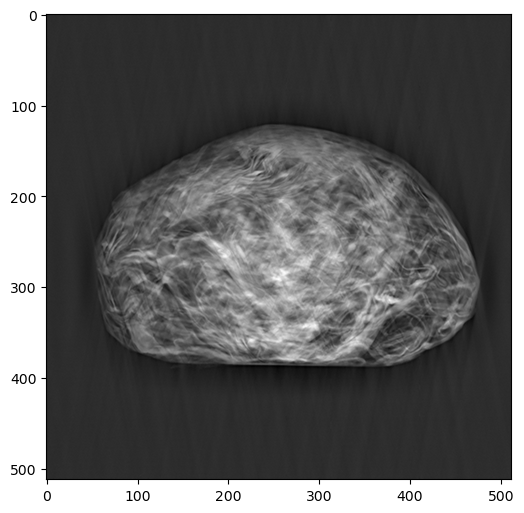

Number of params: 4544037
Starting optimization with ADAM
Iteration 00000 | Loss 0.07553302 | PSNR_noisy: 11.219

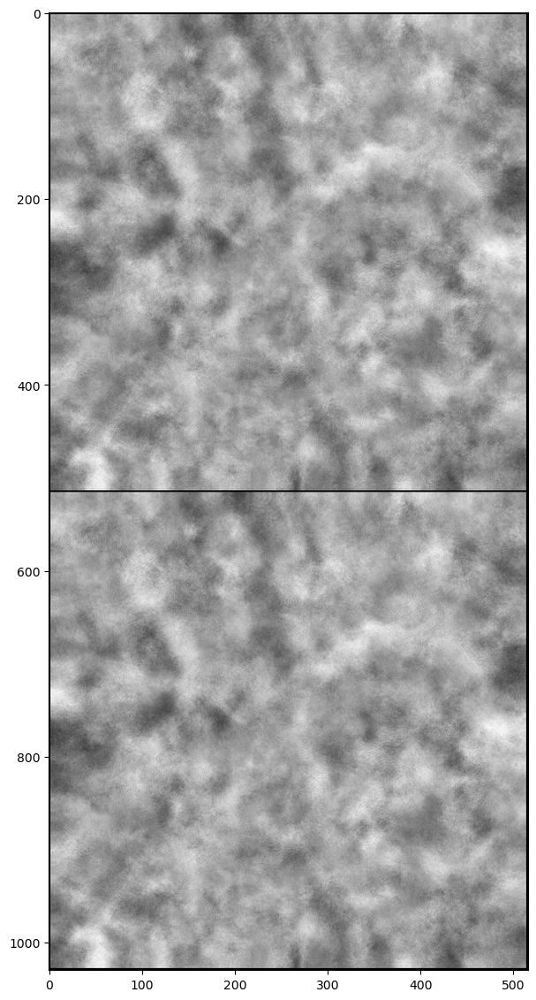

Iteration 00250 | Loss 0.00064592 | PSNR_noisy: 31.898

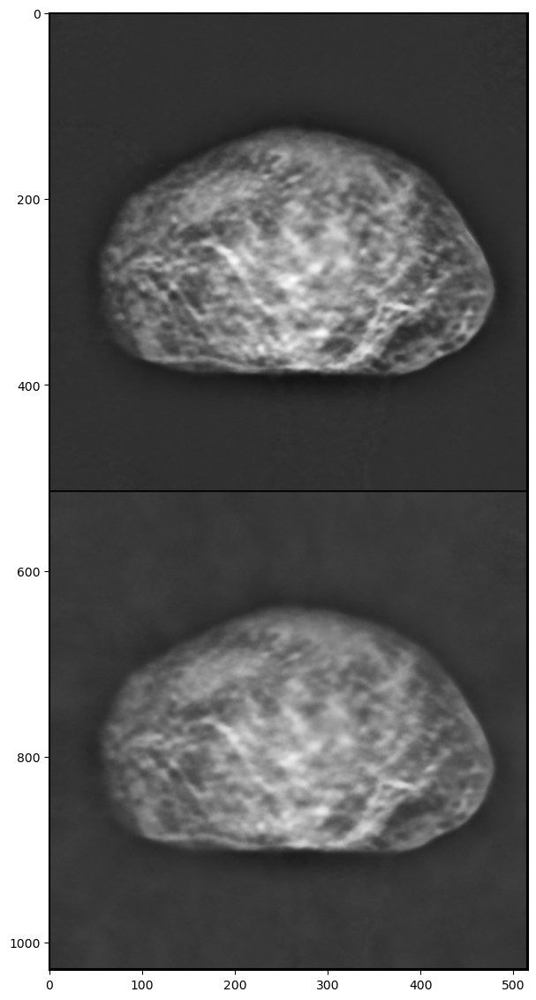

Iteration 00500 | Loss 0.00039594 | PSNR_noisy: 34.024

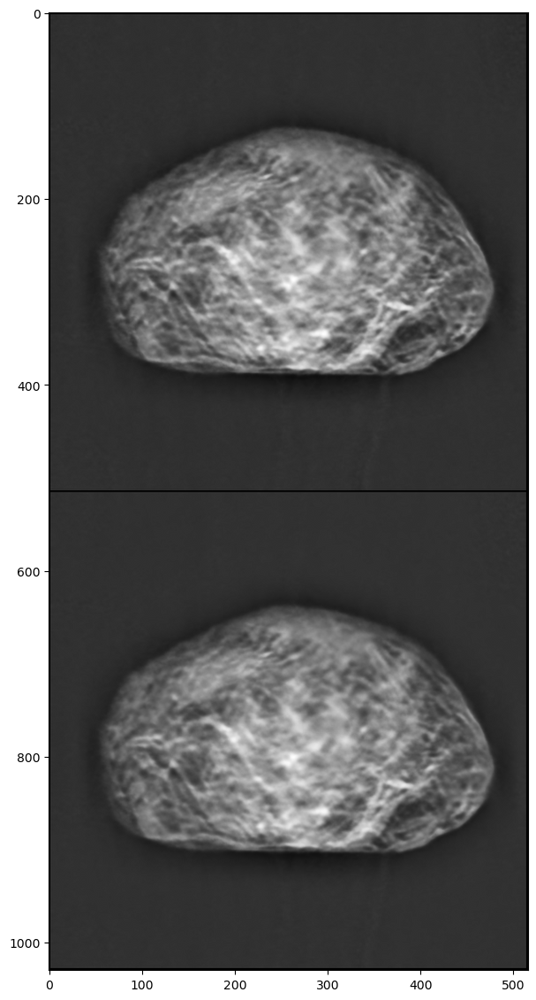

Iteration 00750 | Loss 0.00027275 | PSNR_noisy: 35.642

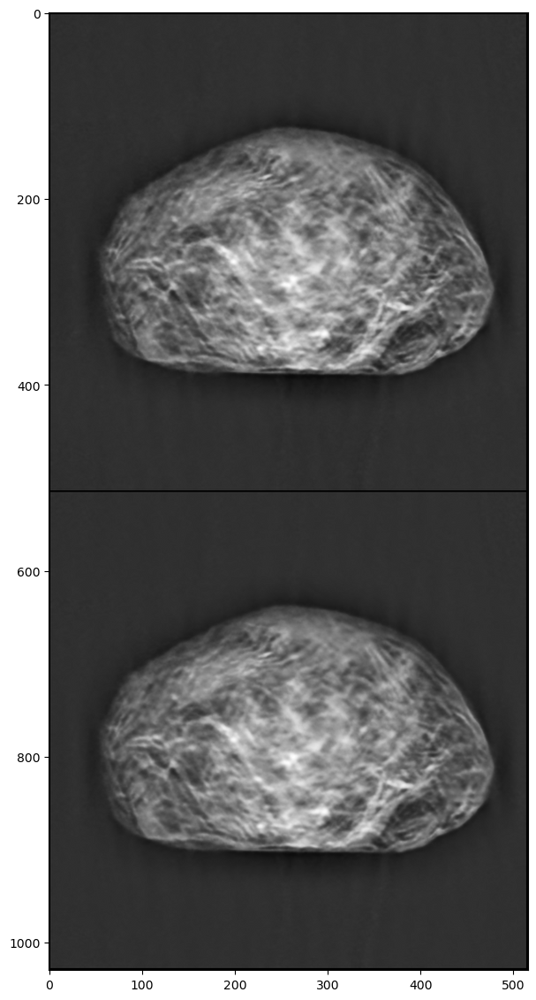

Iteration 01000 | Loss 0.00023409 | PSNR_noisy: 36.306

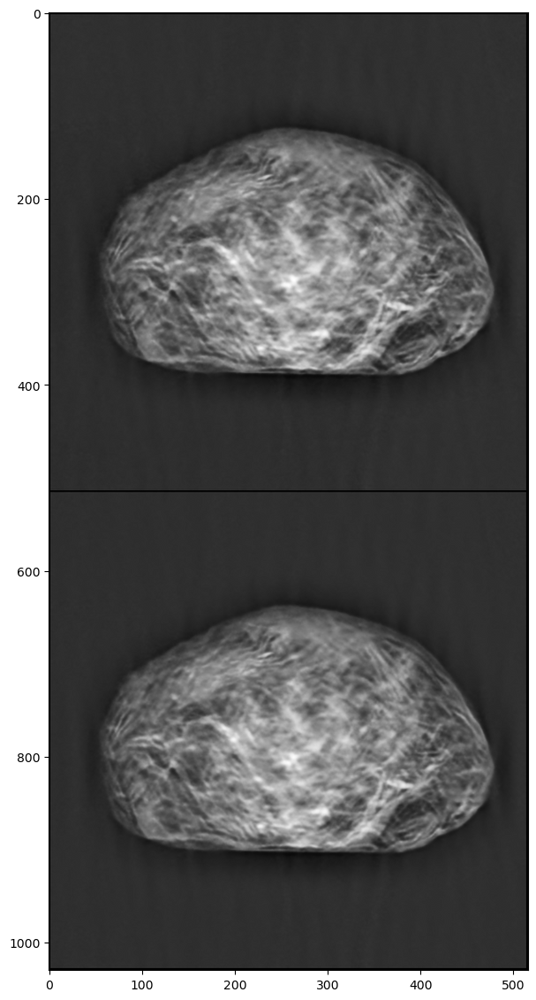

Iteration 01250 | Loss 0.00017225 | PSNR_noisy: 37.638

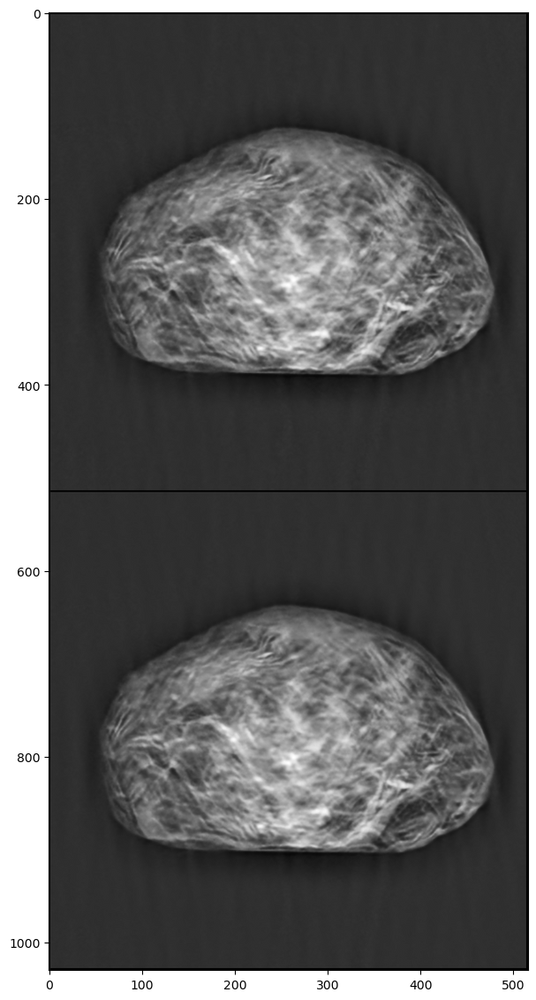

Iteration 01500 | Loss 0.00013973 | PSNR_noisy: 38.547

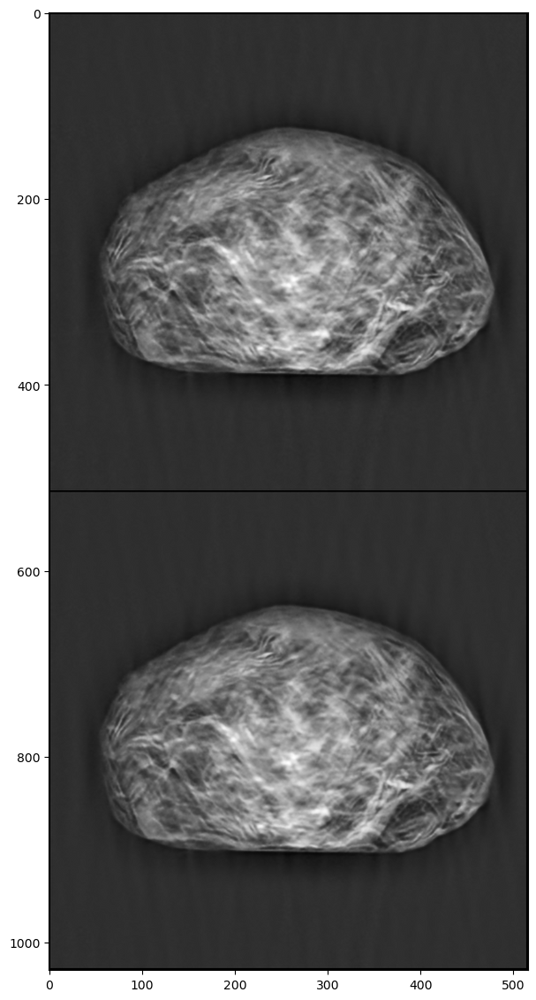

Iteration 01750 | Loss 0.00012634 | PSNR_noisy: 38.985

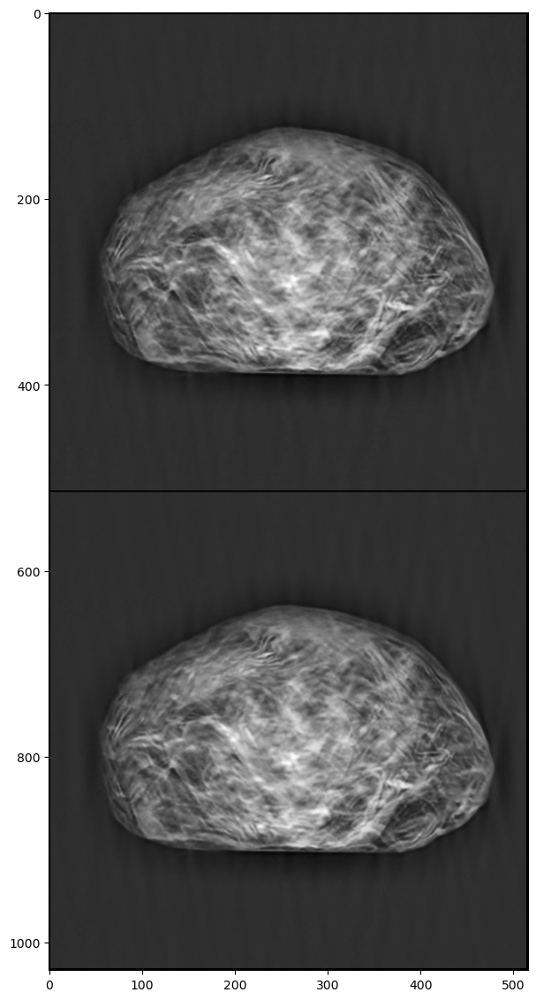

Iteration 02000 | Loss 0.00011330 | PSNR_noisy: 39.458

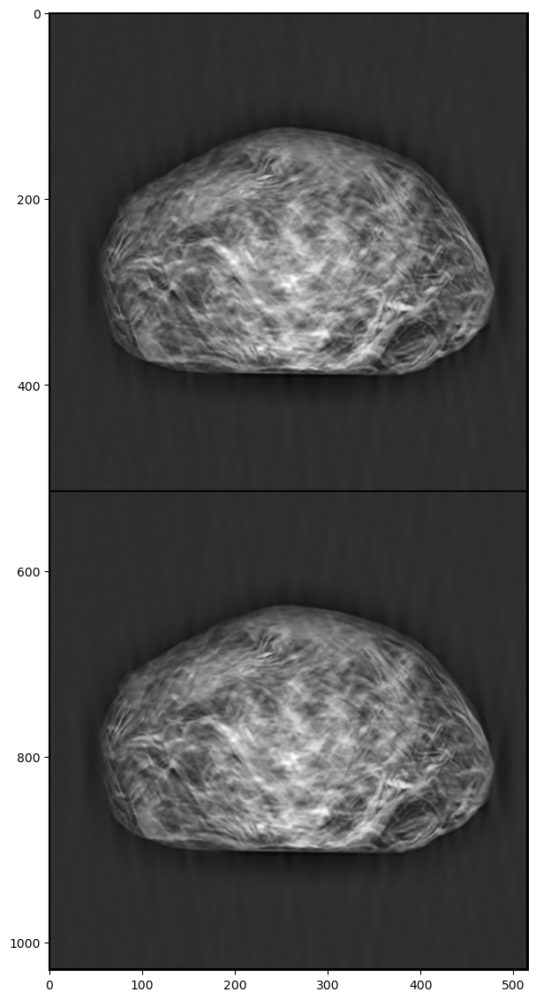

Iteration 02250 | Loss 0.00009597 | PSNR_noisy: 40.179

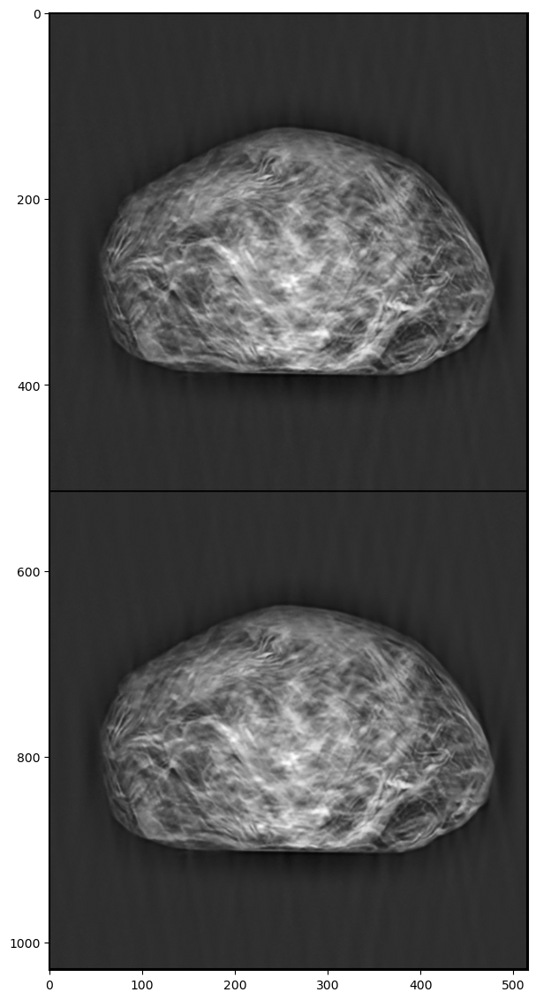

Iteration 02500 | Loss 0.00008782 | PSNR_noisy: 40.564

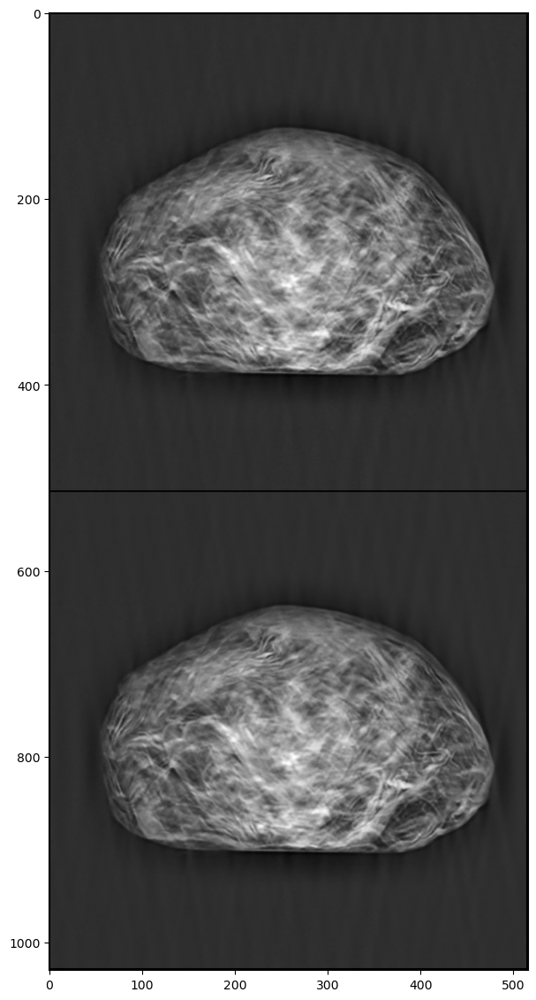

Iteration 02750 | Loss 0.00008128 | PSNR_noisy: 40.900

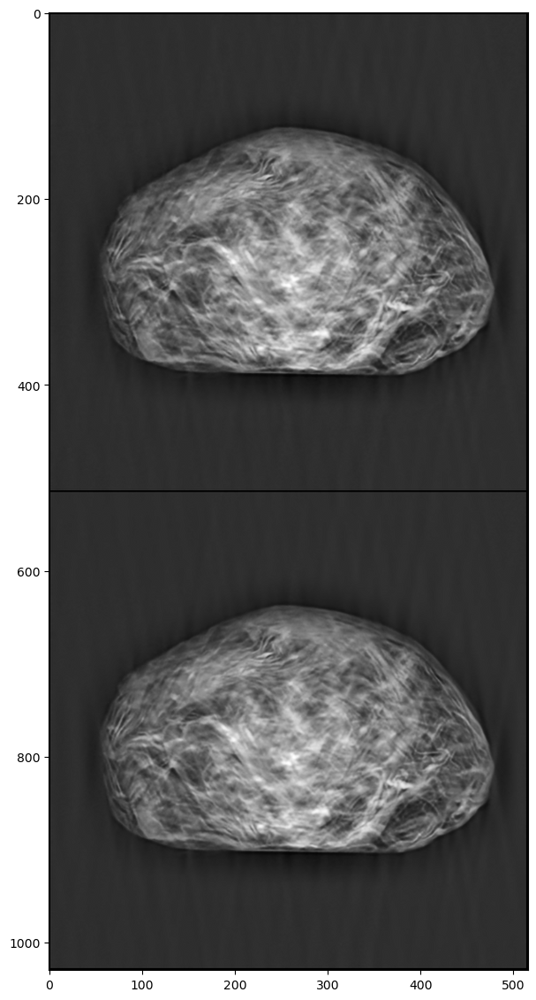

Iteration 02998 | Loss 0.00007146 | PSNR_noisy: 41.459

Processing Images:  50%|████████████████████████████████                                | 1/2 [03:44<03:44, 224.65s/it]

✅ Saved destriped image to: C:/Users/emanu/OneDrive - University of Cape Town/EEE4022S/Data/Final/DIP_Denoise_Out\Cabbage_iter3000_lr0.001_rn0.008.png
✅ Completed Cabbage.png in 224.07s | PSNR: 43.214


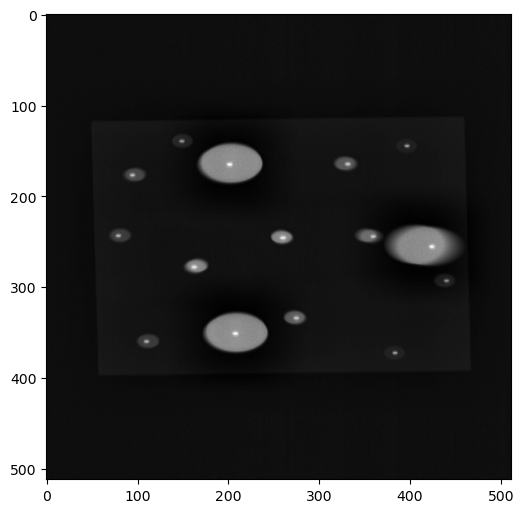

Number of params: 4544037
Starting optimization with ADAM
Iteration 00000 | Loss 0.05691358 | PSNR_noisy: 12.448

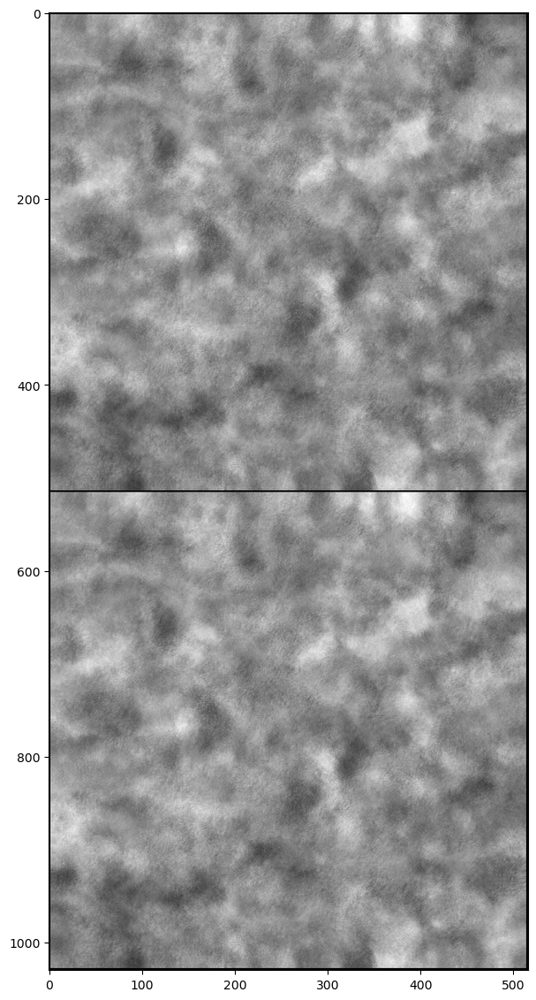

Iteration 00250 | Loss 0.00004240 | PSNR_noisy: 43.727

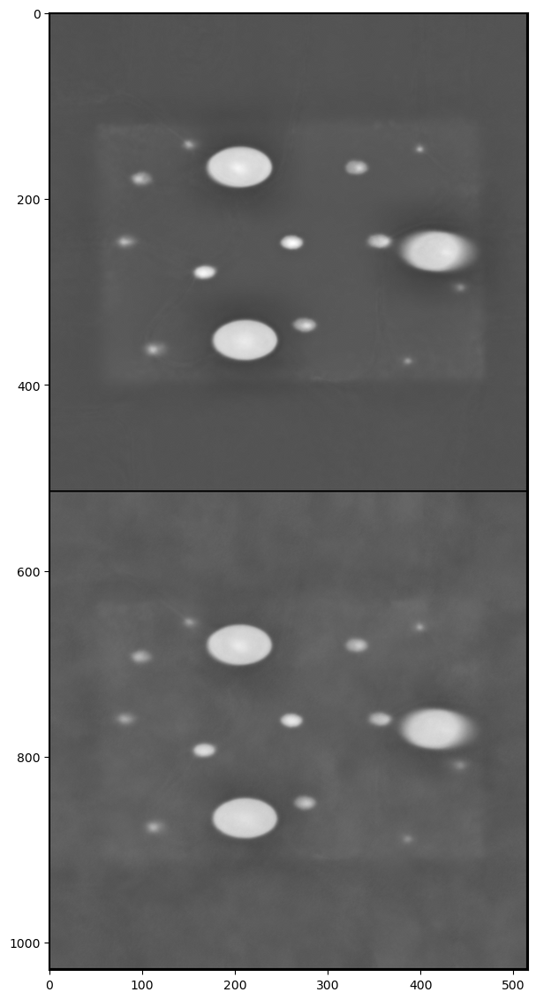

Iteration 00500 | Loss 0.00002122 | PSNR_noisy: 46.733

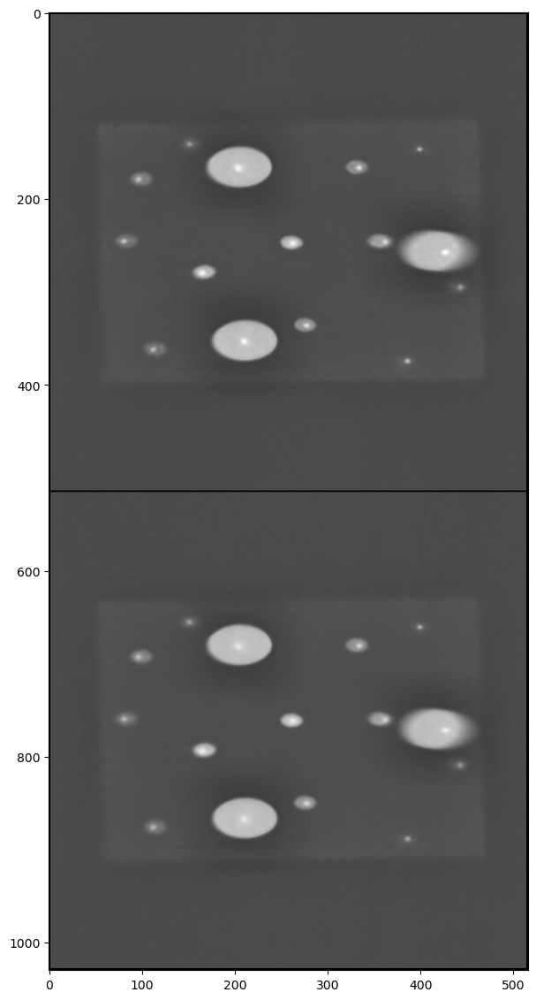

Iteration 00750 | Loss 0.00001329 | PSNR_noisy: 48.765

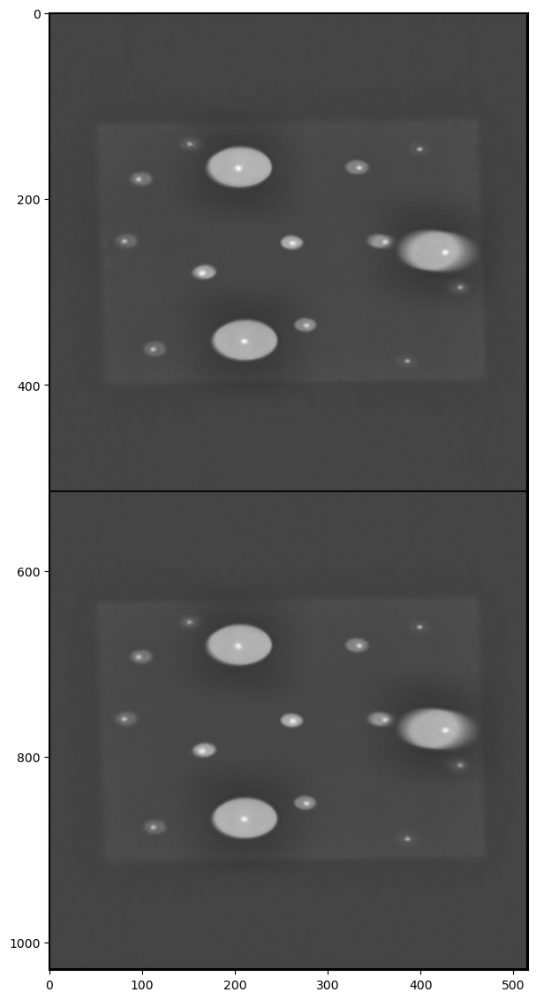

Iteration 01000 | Loss 0.00001095 | PSNR_noisy: 49.607

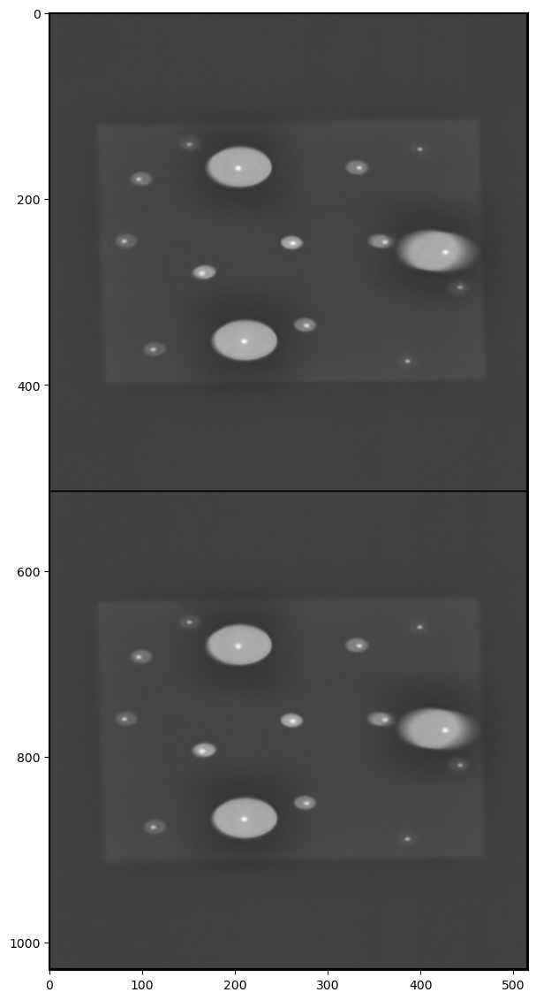

Iteration 01250 | Loss 0.00000876 | PSNR_noisy: 50.574

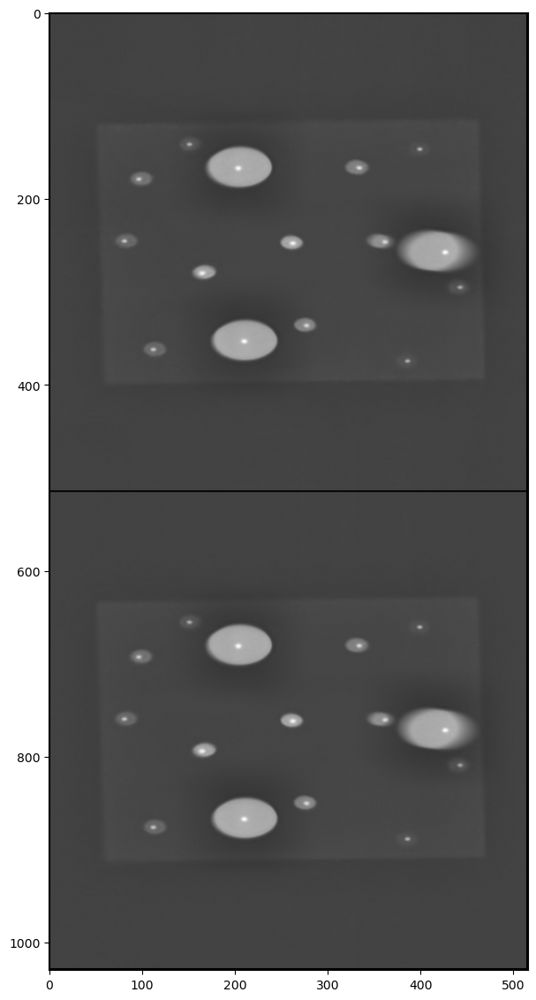

Iteration 01500 | Loss 0.00000793 | PSNR_noisy: 51.008

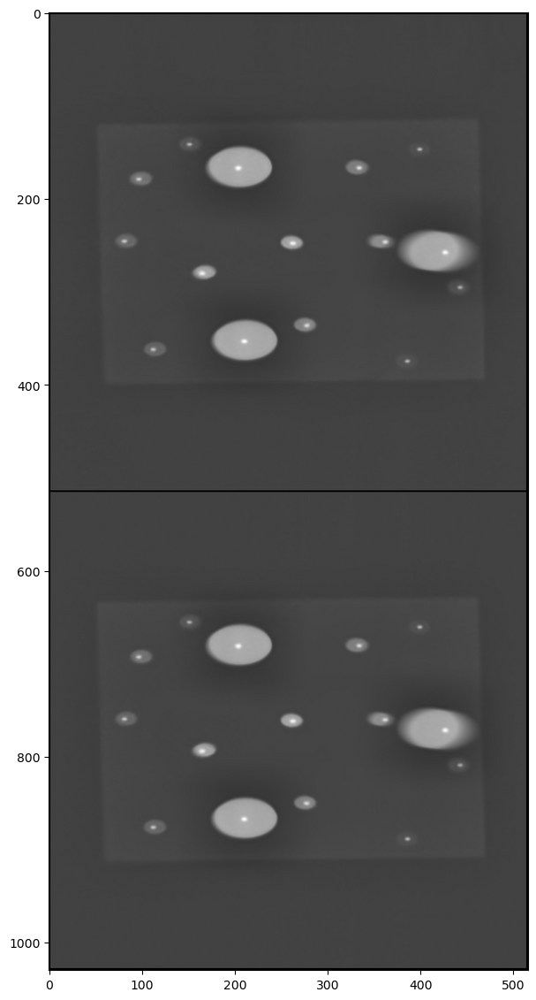

Iteration 01750 | Loss 0.00000773 | PSNR_noisy: 51.119

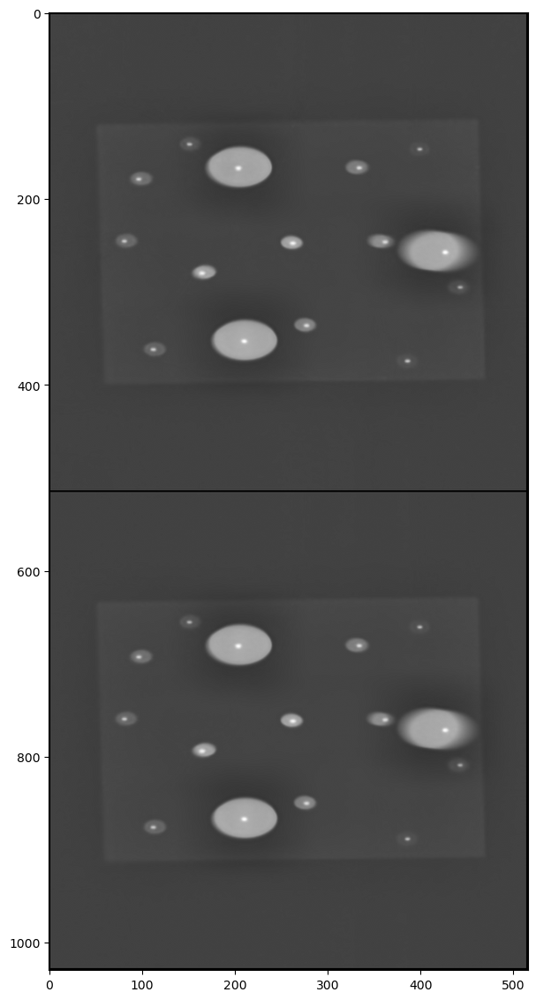

Iteration 02000 | Loss 0.00000927 | PSNR_noisy: 50.331

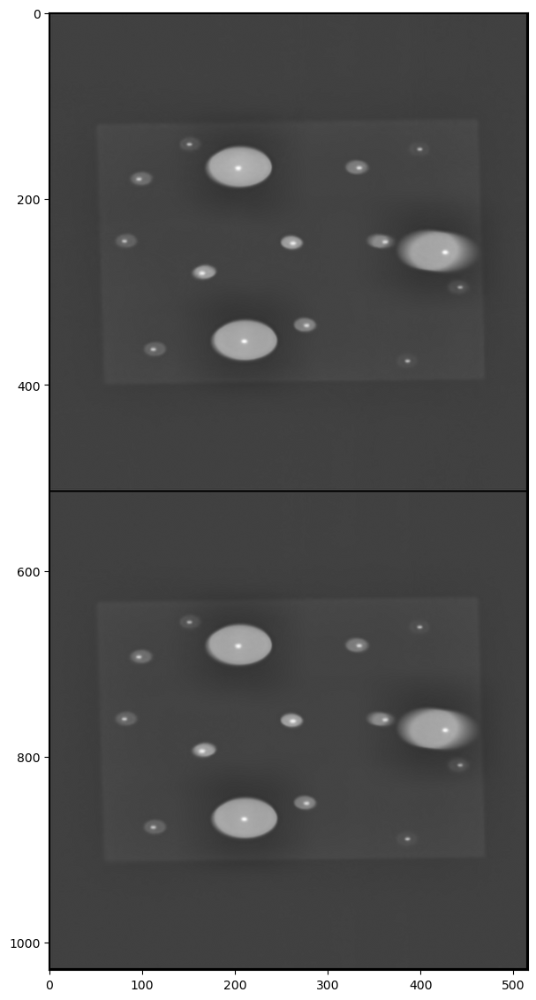

Iteration 02250 | Loss 0.00000633 | PSNR_noisy: 51.985

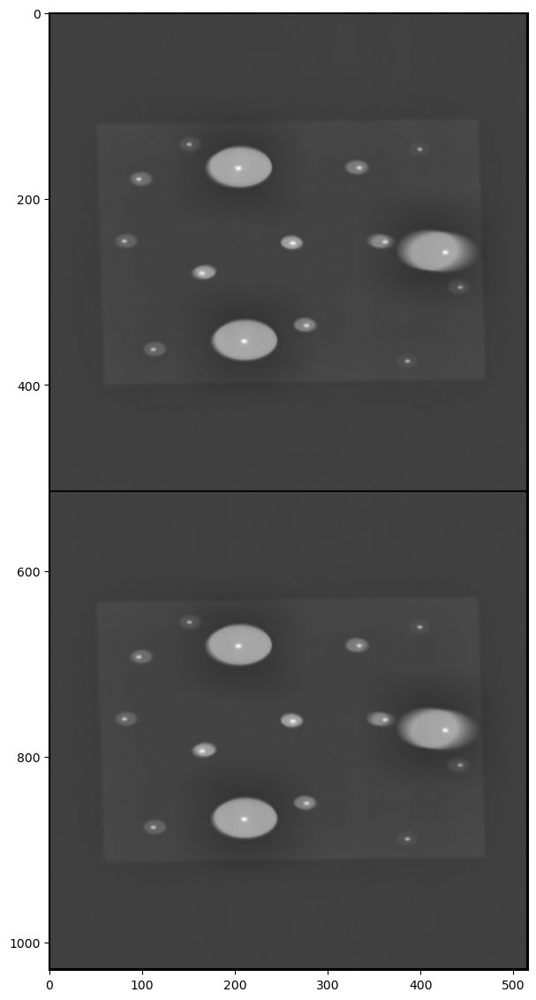

Iteration 02500 | Loss 0.00000715 | PSNR_noisy: 51.459

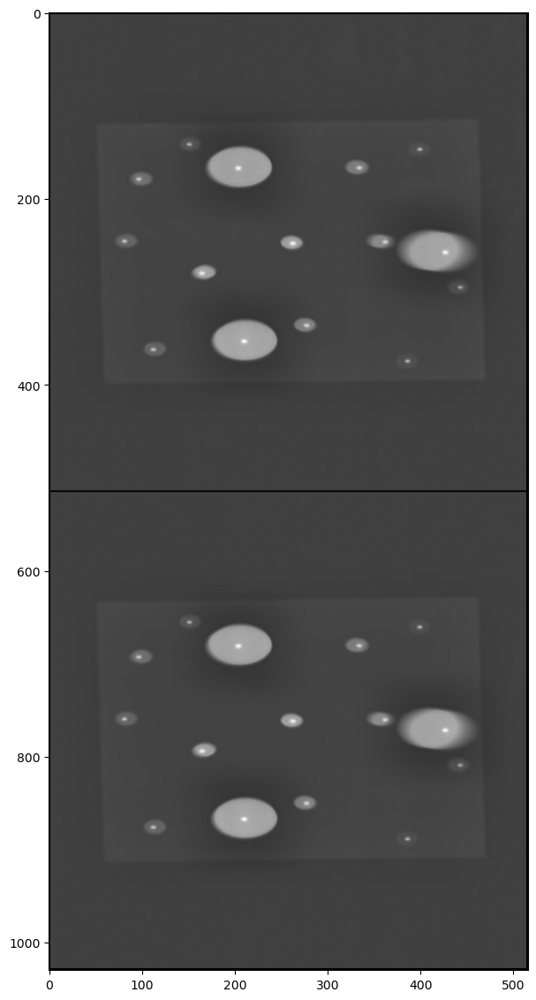

Iteration 02750 | Loss 0.00000658 | PSNR_noisy: 51.819

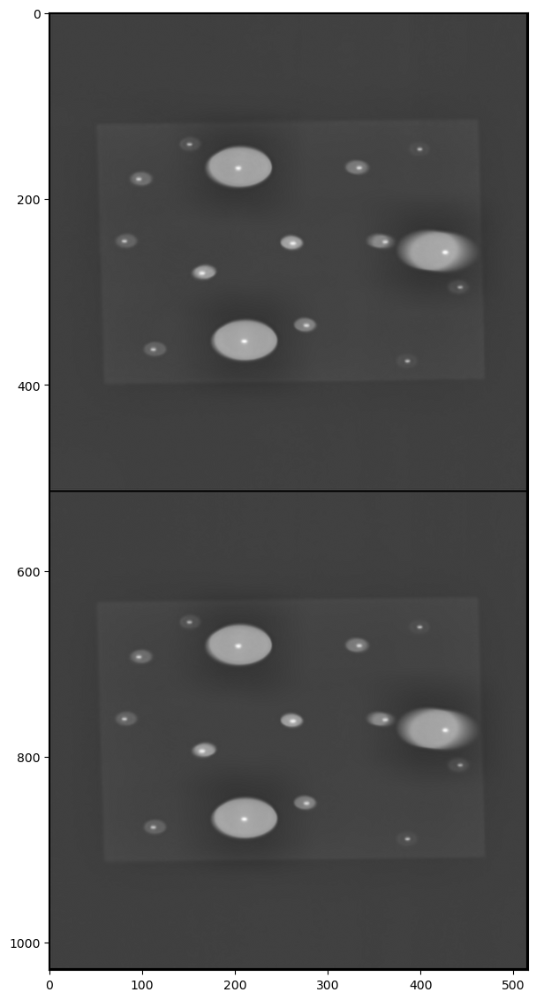

Iteration 02998 | Loss 0.00000480 | PSNR_noisy: 53.185

Processing Images: 100%|████████████████████████████████████████████████████████████████| 2/2 [07:27<00:00, 223.51s/it]

✅ Saved destriped image to: C:/Users/emanu/OneDrive - University of Cape Town/EEE4022S/Data/Final/DIP_Denoise_Out\Phantom_iter3000_lr0.001_rn0.008.png
✅ Completed Phantom.png in 221.81s | PSNR: 52.441


PermissionError: [Errno 13] Permission denied: 'DIP_Denoise.csv'

In [69]:
# --- Begin Batch Processing ---
csv_rows = []
for image_path in tqdm(image_files, desc="Processing Images"):
    input_path = os.path.join(opt.img_dir, image_path)
    base, ext = os.path.splitext(image_path)

    # Build structured filename including key hyperparameters
    output_filename = (
        f"{base}_iter{opt.num_iter}_lr{opt.lr}_rn{opt.reg_noise_std}{ext}"
    )
    output_path = os.path.join(opt.save_results_path, output_filename)

    try:
        # === Step 1: DIP Setup ===
        setup_vars = denoising_dip_setup(input_path, opt)

        # === Step 2: Optimize DIP ===
        start_time = time.time()
        final_denoised = optimize_denoising(setup_vars, opt)
        duration = time.time() - start_time

        # === Step 3: Prepare Data ===
        input_np = setup_vars["img_noisy_np"]
        output_np = torch_to_np(final_denoised)

        # === Step 4: Compute IQA Metrics ===
        input_piqe = input_brisque = input_niqe = float('nan')
        output_piqe = output_brisque = output_niqe = psnr_value = float('nan')

        if metrics_available:
            try:
                input_tensor = prepare_image_for_iqa(input_np)
                output_tensor = prepare_image_for_iqa(output_np)

                # Input IQA
                input_piqe = piqe_metric(input_tensor).item()
                input_brisque = brisque_metric(input_tensor).item()
                input_niqe = niqe_metric(input_tensor).item()

                # Output IQA
                output_piqe = piqe_metric(output_tensor).item()
                output_brisque = brisque_metric(output_tensor).item()
                output_niqe = niqe_metric(output_tensor).item()

                # PSNR (relative to input)
                psnr_value = compare_psnr(input_np, output_np, data_range=1.0)

            except Exception as e:
                print(f"⚠️ IQA metric computation failed for {image_path}: {e}")
        else:
            print("Skipping IQA (metrics unavailable).")

        # === Step 5: Save Output Image ===
        if opt.SAVE_IMAGES:
            out_pil = np_to_pil(output_np)
            out_pil.save(output_path)
            print(f"✅ Saved destriped image to: {output_path}")

        # === Step 6: Append Results to Memory ===
        csv_rows.append([
            image_path, opt.num_iter, opt.lr, opt.reg_noise_std,
            input_piqe, input_brisque, input_niqe,
            output_piqe, output_brisque, output_niqe, psnr_value, duration
        ])

        print(f"✅ Completed {image_path} in {duration:.2f}s | PSNR: {psnr_value:.3f}")

    except Exception as e:
        print(f"❌ Error processing {image_path}: {e}")

# --- End Batch Processing ---

# === Step 7: Save CSV after loop ===
with open(opt.RESULTS_CSV_FILE, mode='a', newline='') as file:
    writer = csv.writer(file)
    writer.writerows(csv_rows)
print(f"\n✅ Processing complete. Results saved to {opt.RESULTS_CSV_FILE}")

In [70]:
# === Step 7: Save CSV after loop ===
with open(opt.RESULTS_CSV_FILE, mode='a', newline='') as file:
    writer = csv.writer(file)
    writer.writerows(csv_rows)
print(f"\n✅ Processing complete. Results saved to {opt.RESULTS_CSV_FILE}")


✅ Processing complete. Results saved to DIP_Denoise.csv


## Main Loop for folder

In [ ]:
# Get a list of all image files in the directory
image_files = [os.path.join(opt.img_dir, f) for f in os.listdir(opt.img_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]

# Loop through each image
for image_path in tqdm(image_files, desc="Processing Images"):
    
    setup_variables = denoising_dip_setup(image_path, opt)
    
    final_denoised_img = optimize_denoising(setup_variables, opt)
    
    if opt.plot:
        show_final(final_denoised_img, setup_variables["img_np"])
        
    # Save the denoised image
    out_pil = np_to_pil(torch_to_np(final_denoised_img))
    
    base_filename = os.path.basename(image_path)
    save_filename = f"denoised_{base_filename}"
    save_path = os.path.join(opt.save_results_path, save_filename)
    
    out_pil.save(save_path)
    print(f"\nSaved denoised image to: {save_path}")

print("\n--- All images processed. ---")

## Code for Single image

In [ ]:
image_path = 'C:/Users/emanu/OneDrive - University of Cape Town/EEE4022S/Data/DIP_512x512/Lemon_destriped.png'

print(f"\n--- Starting Denoising for: {os.path.basename(image_path)} ---")
    
setup_variables = denoising_dip_setup(image_path, opt)
    
final_denoised_img = optimize_denoising(setup_variables, opt)
    
if opt.plot:
    show_final(final_denoised_img, setup_variables["img_np"])
        
out_pil = np_to_pil(torch_to_np(final_denoised_img))
    
base_filename = os.path.basename(image_path)
save_filename = f"denoised_{base_filename}"
save_path = os.path.join(opt.save_results_path, save_filename)
    
out_pil.save(save_path)
print(f"\nSaved denoised image to: {save_path}")

In [5]:
def calculate_and_save_residual(image_path1, image_path2, output_path):
    """
    Calculates the residual (difference) between two images and saves the result.
    
    The residual is calculated as (image1 - image2 + 128), then clipped to [0, 255].
    This makes zero-difference areas mid-gray.

    Args:
        image_path1 (str): Filepath for the first image.
        image_path2 (str): Filepath for the second image.
        output_path (str): Filepath to save the residual image.
    """
    try:
        # --- 1. Load Images ---
        img1 = Image.open(image_path1)
        img2 = Image.open(image_path2)

        # --- 2. Convert to NumPy arrays (as float for calculation) ---
        arr1 = np.array(img1, dtype=np.float32)
        arr2 = np.array(img2, dtype=np.float32)

        # --- 3. Check Dimensions ---
        if arr1.shape != arr2.shape:
            print(f"Error: Images have different dimensions.")
            print(f"  Image 1: {arr1.shape}")
            print(f"  Image 2: {arr2.shape}")
            return

        # --- 4. Calculate Residual ---
        # Subtract and add 128 to center the range (0 difference = 128 gray)
        residual_array = (arr1 - arr2) + 128.0

        # --- 5. Clip and Convert to 8-bit Integer ---
        # Clip values to the valid [0, 255] range
        clipped_array = np.clip(residual_array, 0, 255)
        
        # Convert back to unsigned 8-bit integer for saving as PNG
        final_array = clipped_array.astype(np.uint8)

        # --- 6. Create Output Directory ---
        output_folder = os.path.dirname(output_path)
        if output_folder and not os.path.exists(output_folder):
            os.makedirs(output_folder)
            print(f"Created directory: {output_folder}")

        # --- 7. Save Residual Image ---
        # Create a new PIL Image from the final array
        # The mode (e.g., 'L' for grayscale, 'RGB' for color) is inferred
        residual_image = Image.fromarray(final_array)
        residual_image.save(output_path)

        print(f"Successfully saved residual image to: {output_path}")

    except FileNotFoundError as e:
        print(f"Error: File not found. {e}")
    except Exception as e:
        print(f"An error occurred: {e}")

# --- Example Usage ---

# 1. Define file paths
img1_path = "C:/Users/emanu/OneDrive - University of Cape Town/EEE4022S/Data/Final/DIP_Denoise_In/Phantom.png"
img2_path = "C:/Users/emanu/OneDrive - University of Cape Town/EEE4022S/Data/Final/DIP_Denoise_chosen/Phantom_dip_4.png"

# 2. Define the output folder and filename
output_folder = "C:/Users/emanu/OneDrive - University of Cape Town/EEE4022S/Data/Final/DIP_Denoise_chosen"
output_filename = "Phantom_res_dip_4.png"
output_file_path = os.path.join(output_folder, output_filename)

# 3. Run the function
calculate_and_save_residual(img1_path, img2_path, output_file_path)

Successfully saved residual image to: C:/Users/emanu/OneDrive - University of Cape Town/EEE4022S/Data/Final/DIP_Denoise_chosen\Phantom_res_dip_4.png


In [10]:
import matplotlib.pyplot as plt
import numpy as np

# Data
models = ['N2S', 'Nei2Nei', 'DIP']
images = ['Cabbage', 'Phantom']

# Metrics
piqe_diff = [2.63, 1.84, 2.48, 18.34, 12.72, -14.26]
brisque_diff = [-14.86, -14.36, -25.04, -9.78, -9.79, -47.84]
niqe_diff = [-0.88, -0.12, -0.23, -1.53, 0.03, -2.36]
psnr = [38.48, 50.00, 44.23, 47.09, 59.47, 53.72]

def plot_metric(metric_data, ylabel, filename):
    x = np.arange(len(images))
    width = 0.2
    spacing = 0.05

    fig, ax = plt.subplots(figsize=(8, 5))

    # Find y-axis bounds with a margin for labels
    max_val = max(metric_data)
    min_val = min(metric_data)
    margin = 0.1 * (max_val - min_val if max_val != min_val else abs(max_val))
    ax.set_ylim(min_val - margin, max_val + margin)

    for i in range(3):
        values = [metric_data[i], metric_data[i + 3]]
        positions = x + (i - 1) * (width + spacing)
        bars = ax.bar(positions, values, width, label=models[i])

        # Label each bar
        for bar in bars:
            height = bar.get_height()
            offset = 0.02 * (max_val - min_val)
            ax.text(
                bar.get_x() + bar.get_width() / 2,
                height + (offset if height >= 0 else -offset),
                f'{height:.2f}',
                ha='center',
                va='bottom' if height >= 0 else 'top',
                fontsize=12,
            )

    ax.set_xticks(x)
    ax.set_xticklabels(images, fontsize=16)
    ax.set_ylabel(ylabel, fontsize=16)
    ax.tick_params(axis='y', labelsize=14)
    ax.grid(axis='y', linestyle='--', alpha=0.7)
    ax.legend(fontsize=14, loc='center left', bbox_to_anchor=(1.02, 0.5))

    plt.tight_layout(rect=[0, 0, 0.85, 1])
    plt.savefig(filename, format='pdf', bbox_inches='tight')
    plt.close(fig)

# Save the four metric plots
plot_metric(piqe_diff, 'PIQE Difference', 'PIQE_diff.pdf')
plot_metric(brisque_diff, 'BRISQUE Difference', 'BRISQUE_diff.pdf')
plot_metric(niqe_diff, 'NIQE Difference', 'NIQE_diff.pdf')
plot_metric(psnr, 'PSNR', 'PSNR.pdf')
